Creates a csv of present day carbonate factories from Fig, 1 in Laugie et al, 2019 (10.1038/s41598-019-52821-2), but using the classifications for carbonates from Michel et al 2019. This can then be used in biomod2.

Note this file name was changed from carb_factory.ipynb

In [132]:
import cv2 
import numpy as np
import matplotlib.pyplot as plt
import os
import pygmt    
import xarray as xr
import rioxarray as rio 
from scipy import interpolate
from scipy.interpolate import NearestNDInterpolator


%matplotlib inline

In [133]:
# Load sample earth relief data
grid = pygmt.datasets.load_earth_relief(resolution="10m",registration="gridline")
grid

<xarray.DataArray 'z' (lat: 1081, lon: 2161)> Size: 19MB
array([[ 2860.5,  2860.5,  2860.5, ...,  2860.5,  2860.5,  2860.5],
       [ 2926.5,  2916.5,  2905. , ...,  2905.5,  2917. ,  2926.5],
       [ 2958. ,  2953. ,  2951.5, ...,  2952. ,  2953.5,  2958. ],
       ...,
       [-4202. , -4201. , -4200. , ..., -4196. , -4202. , -4202. ],
       [-4205.5, -4204.5, -4203. , ..., -4204. , -4205.5, -4205.5],
       [-4204. , -4204. , -4204. , ..., -4204. , -4204. , -4204. ]])
Coordinates:
  * lat      (lat) float64 9kB -90.0 -89.83 -89.67 -89.5 ... 89.67 89.83 90.0
  * lon      (lon) float64 17kB -180.0 -179.8 -179.7 ... 179.7 179.8 180.0
Attributes:
    Conventions:       CF-1.7
    title:             SRTM15 Earth Relief v2.6 at 10 arc minutes
    history:           
    description:       IGPP Earth relief
    long_name:         elevation (m)
    units:             meters
    vertical_datum:    EGM96
    horizontal_datum:  WGS84

In [134]:
# Read in the figure from Laugie et al 2019
# Note that this requires a bit of masking with paint
# Pending a response from the authors, this is the best solution we have
img = cv2.imread('data/laugie2019_edit.png')   
img_hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV) # This is no longer needed (Tristan's code used HSV to track cabronates but I found RGB worked better)

libpng warning: iCCP: known incorrect sRGB profile


In [135]:
## Uncomment this box to convert to hsv using matplotlib colours
## Gives the same result as cv but keeping the code in case to use in future
# import matplotlib.colors as mc
# img2 = img/[255, 255, 255]
# img2[0][0]
# img_hsv2 = mc.rgb_to_hsv(img2.copy())

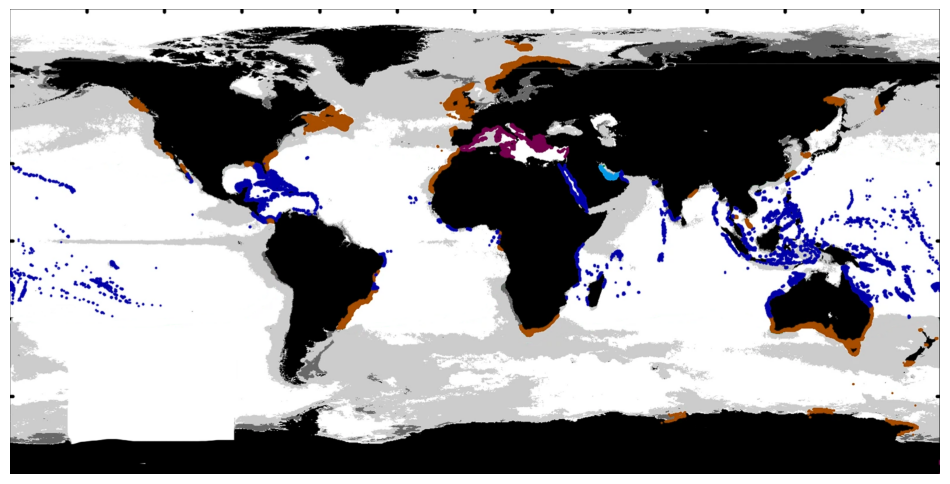

In [136]:
plt.figure(figsize=(12, 12))
plt.imshow(img)
plt.axis('off')
plt.show()

In [137]:
# Classify different carbonate types based on RGB values
# I used photoshop to get the range of RGB value for each carbonate type
lower_photozoan_t = np.array([0,0,120])
upper_photozoan_t = np.array([70,65,200])

lower_heterozoan_c = np.array([130,50,0])
upper_heterozoan_c = np.array([190,135,90])

lower_photozoan_c = np.array([85,0,55])
upper_photozoan_c = np.array([145,75,130])

lower_biochem = np.array([0,130,180])
upper_biochem = np.array([80,170,240])


In [138]:
mask_photozoan_t = cv2.inRange(img, lower_photozoan_t, upper_photozoan_t)
res_photozoan_t = cv2.bitwise_and(img, img, mask= mask_photozoan_t)

mask_heterozoan_c = cv2.inRange(img, lower_heterozoan_c, upper_heterozoan_c)
res_heterozoan_c = cv2.bitwise_and(img, img, mask= mask_heterozoan_c)

mask_photozoan_c = cv2.inRange(img, lower_photozoan_c, upper_photozoan_c)
res_photozoan_c = cv2.bitwise_and(img, img, mask= mask_photozoan_c)

mask_biochem = cv2.inRange(img, lower_biochem, upper_biochem)
res_biochem = cv2.bitwise_and(img, img, mask= mask_biochem)

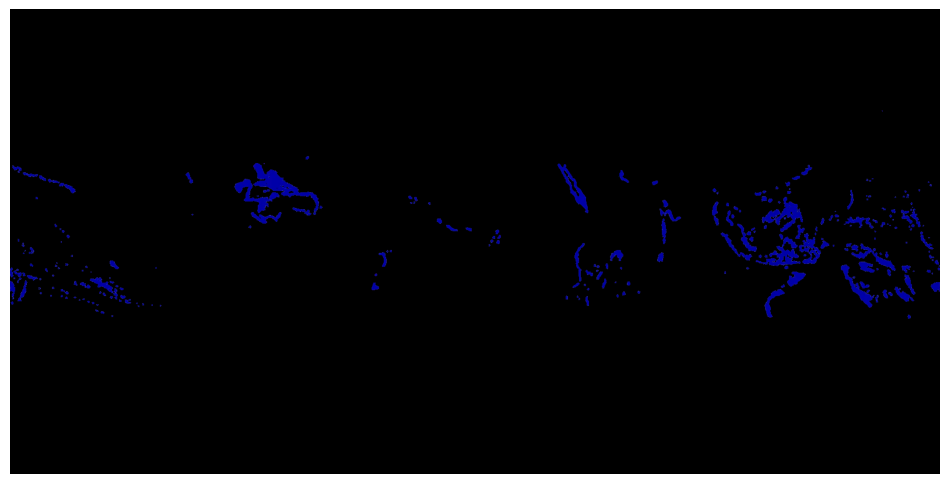

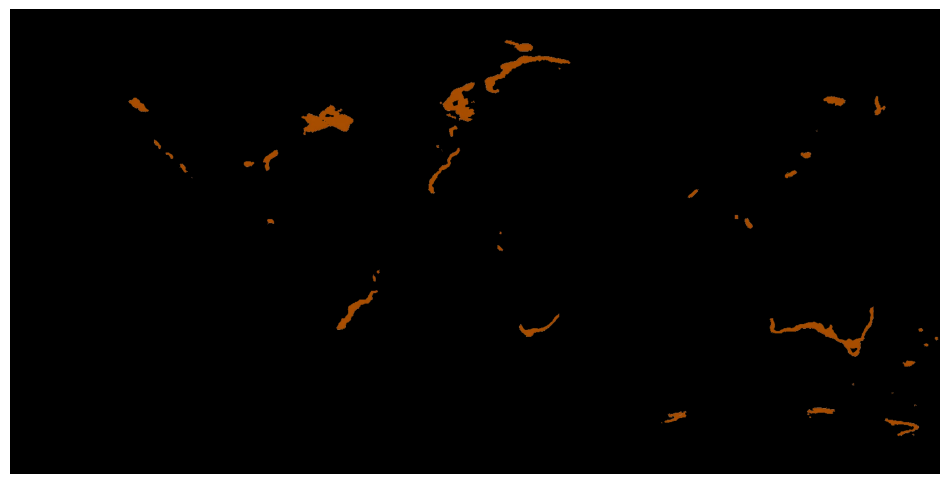

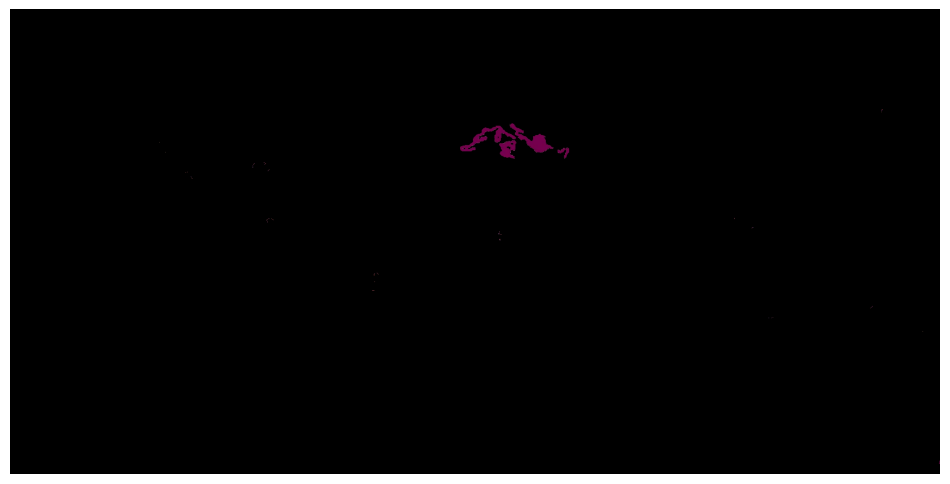

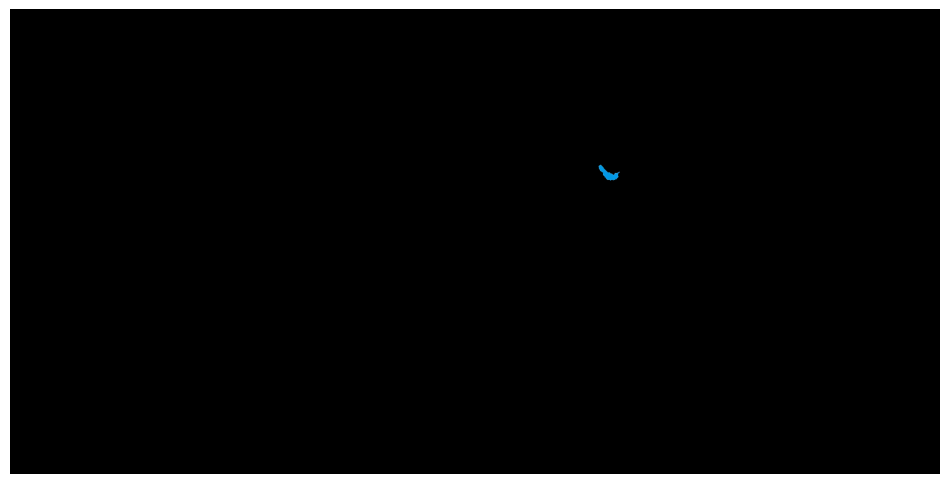

In [139]:
plt.figure(figsize=(12, 12))
plt.imshow(res_photozoan_t)
plt.axis('off')
plt.show()

plt.figure(figsize=(12, 12))
plt.imshow(res_heterozoan_c)
plt.axis('off')
plt.show()

plt.figure(figsize=(12, 12))
plt.imshow(res_photozoan_c)
plt.axis('off')
plt.show()

plt.figure(figsize=(12, 12))
plt.imshow(res_biochem)
plt.axis('off')
plt.show()


In [140]:
# The size of the image in pixels 
carbfactory = np.zeros((797, 1595))

# Assign unique IDs to each type so we can combine inot one figure
ids = np.where(np.logical_or(res_heterozoan_c[:,:,2]>0,res_heterozoan_c[:,:,1]>0))
carbfactory[ids] = 4

ids = np.where(np.logical_or(res_photozoan_c[:,:,2]>0,res_photozoan_c[:,:,1]>0))
carbfactory[ids] = 3

ids = np.where(np.logical_or(res_biochem[:,:,2]>0,res_biochem[:,:,1]>0))
carbfactory[ids] = 1

ids = np.where(np.logical_or(res_photozoan_t[:,:,2]>0,res_photozoan_t[:,:,1]>0))
carbfactory[ids] = 2

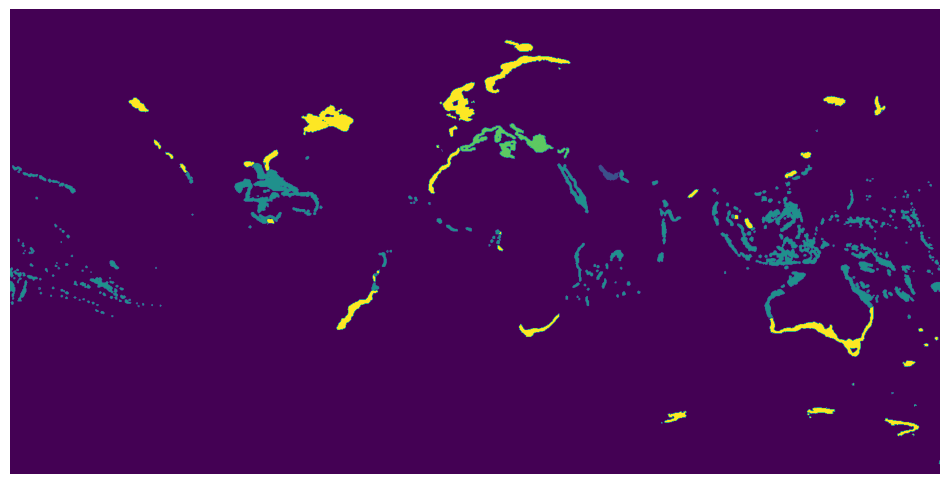

In [141]:
plt.figure(figsize=(12, 12))
plt.imshow(carbfactory)
plt.axis('off')
plt.show()

In [142]:
# Widen the figure
ncarbfactory = np.zeros((801, 1595))

ncarbfactory[2:-2,:] = carbfactory

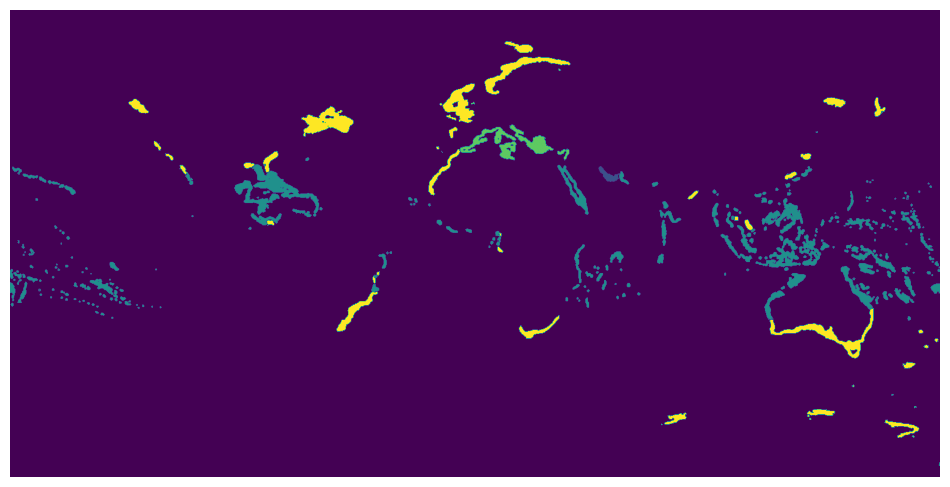

In [143]:
plt.figure(figsize=(12, 12))
plt.imshow(ncarbfactory)
plt.axis('off')
plt.show()

In [144]:
# Impose onto a geographical grid
lon = np.linspace(-180,180,1595)
lat = np.linspace(-90,90,801)
f = interpolate.RectBivariateSpline(lat, lon, ncarbfactory, kx=1, ky=1)
carb = f(grid.lon.values, grid.lat.values)

In [145]:
# Try a different method
mlon, mlat = np.meshgrid(lon, lat)
interp = NearestNDInterpolator(list(zip(mlon.flatten(), mlat.flatten())), ncarbfactory.flatten())
mlon2, mlat2 = np.meshgrid(grid.lon.values, grid.lat.values)
Carbfact = interp(mlon2, mlat2)

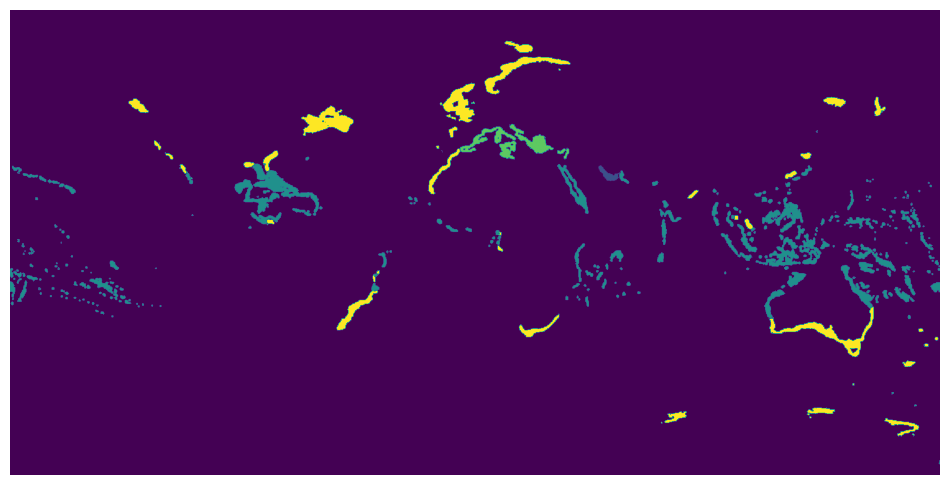

In [146]:
plt.figure(figsize=(12, 12))
plt.imshow(Carbfact)
plt.axis('off')
plt.show()

In [147]:
# Assign to xarray
ds_carb = xr.Dataset({})
ds_carb['elevation'] = grid # This is the elevation grid downloaded at the start
ds_carb['carbfac'] = (('lat','lon'),np.flipud(Carbfact))
ds_carb

<xarray.Dataset> Size: 37MB
Dimensions:    (lat: 1081, lon: 2161)
Coordinates:
  * lat        (lat) float64 9kB -90.0 -89.83 -89.67 -89.5 ... 89.67 89.83 90.0
  * lon        (lon) float64 17kB -180.0 -179.8 -179.7 ... 179.7 179.8 180.0
Data variables:
    elevation  (lat, lon) float64 19MB 2.86e+03 2.86e+03 ... -4.204e+03
    carbfac    (lat, lon) float64 19MB 0.0 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0

In [148]:
# Grid of carbonates where everything else is a NaN
factory = ds_carb.carbfac.where(ds_carb.elevation<2000) # Also remove carbonates at high elevations
factory2 = factory.where(factory>0.1)


grdimage [WARNING]: Longitude range too small; geographic boundary condition changed to natural.


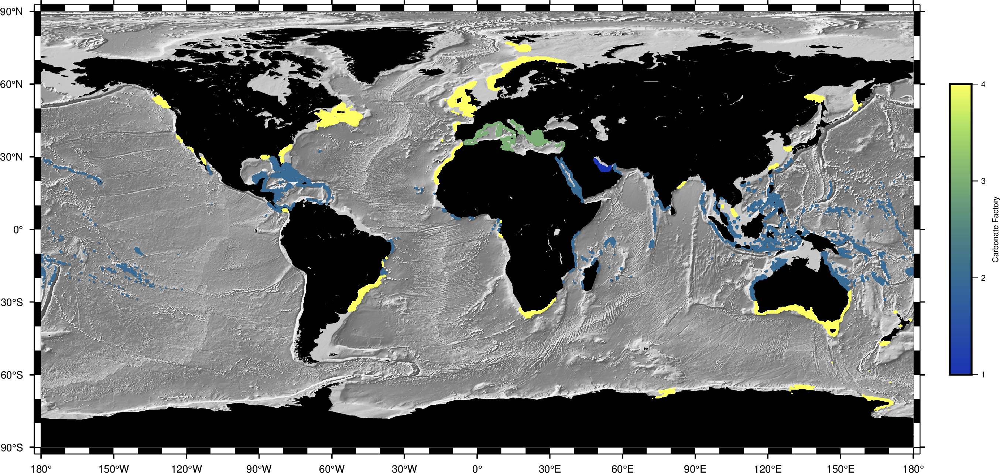

In [149]:
# Robinson projection N12c
# Mollweide projection W6i

fig = pygmt.Figure()

# Plotting elevation
with pygmt.config(FONT='4p,Helvetica,black'):
    pygmt.makecpt(cmap="gray", series=[-15000, 4000])
    fig.basemap(region='d', projection="Q12c", frame='afg')
    fig.grdimage(ds_carb.elevation, shading=True, frame=False) #,transparency=50)
    
    fig.coast(
    land="black",
#     water="lightcyan",
    )
    pygmt.makecpt(cmap="imola", series=[1, 4])
#     fig.basemap(region='d', projection='W6i', frame='afg')
    fig.grdimage(factory2, shading=False, frame=False, nan_transparent=True)
    
    # Add contour
#     fig.grdcontour(
#         interval=0.1,
#         grid=ds_carb.elevation,
#         limit=[-0.1, 0.1],
#     )
    
    
with pygmt.config(FONT='6p,Helvetica,black'):
#     fig.colorbar(position="jBC+o0c/-1.5c+w8c/0.3c+h",frame=["a5", "x+lalpha richness"])
    fig.colorbar(position="JMR+o0.5c/0c+w4c/0.3c",frame=["a1", "x+lCarbonate Factory"])
    
# Customising the font style
# fig.text(text="M0 2", position="TL", font="7p,Helvetica-Bold,black") #, xshift="-0.75c")

fig.show(dpi=500, width=1000)

In [150]:
test = ds_carb.carbfac.where((ds_carb.carbfac==3) & (ds_carb.lat<25),2)
ids = np.where(test.values>2)

test2 = ds_carb.carbfac.where((ds_carb.carbfac==3) & (ds_carb.lon<-5),2)
ids2 = np.where(test2.values>2)

test3 = ds_carb.carbfac.where((ds_carb.carbfac==3) & (ds_carb.lon>45),2)
ids3 = np.where(test3.values>2)

carbMap = ds_carb.carbfac.values.copy()
carbMap[ids] = 2
carbMap[ids2] = 2
carbMap[ids3] = 2
# ds_carb['carbfac'] = (('lat','lon'),np.flipud(Carbfact))

In [151]:
test4 = ds_carb.carbfac.where((ds_carb.carbfac==4) & (ds_carb.lat>30) & 
                              (ds_carb.lat<45) & (ds_carb.lon>-5) & (ds_carb.lon<42), 2)
ids4 = np.where(test4.values>3)
carbMap[ids4] = 3

test5 = ds_carb.carbfac.where((ds_carb.carbfac==3) & (ds_carb.lat>20) & 
                              (ds_carb.lat<31) & (ds_carb.lon>28) & (ds_carb.lon<42), 2)
ids5 = np.where(test5.values>2)
carbMap[ids5] = 2

In [152]:
test6 = ds_carb.carbfac.where((ds_carb.carbfac!=1) & (ds_carb.lat>30) & 
                              (ds_carb.lat<40) & (ds_carb.lon>-6) & (ds_carb.lon<0))
ids6 = np.where(test6.values>0)
carbMap[ids6] = 3


In [153]:
test7 = ds_carb.carbfac.where((ds_carb.carbfac==2) & (ds_carb.lat>40))
ids7 = np.where(test7.values>0)
carbMap[ids7] = 4

In [154]:
ds_carb.carbfac.where((ds_carb.carbfac==2) & (ds_carb.lat>40), drop=True)

<xarray.DataArray 'carbfac' (lat: 3, lon: 2)> Size: 48B
array([[nan,  2.],
       [ 2.,  2.],
       [ 2.,  2.]])
Coordinates:
  * lat      (lat) float64 24B 50.17 50.33 50.5
  * lon      (lon) float64 16B 157.7 157.8

In [155]:
ds_carb['carbfac2'] = (('lat','lon'),carbMap)

In [156]:
factory2 = ds_carb.carbfac2.where(ds_carb.carbfac2>0.1)

grdimage [WARNING]: Longitude range too small; geographic boundary condition changed to natural.


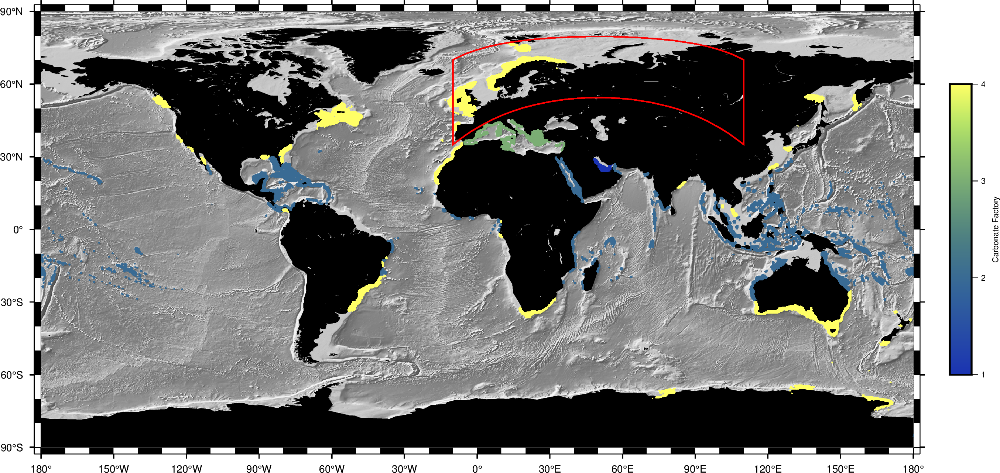

In [157]:
fig = pygmt.Figure()

# Plotting elevation
with pygmt.config(FONT='4p,Helvetica,black'):
    pygmt.makecpt(cmap="gray", series=[-15000, 4000])
    fig.basemap(region='d', projection="Q12c", frame='afg')
    fig.grdimage(ds_carb.elevation, shading=True, frame=False) #,transparency=50)
    
    fig.coast(
    land="black",
    )
    pygmt.makecpt(cmap="imola", series=[1, 4])
    fig.grdimage(factory2, shading=False, frame=False, nan_transparent=True)
    
    fig.plot(data=np.array([[-10,35,110,70]]), style='r+s', pen="0.5p,red")
    
with pygmt.config(FONT='6p,Helvetica,black'):
#     fig.colorbar(position="jBC+o0c/-1.5c+w8c/0.3c+h",frame=["a5", "x+lalpha richness"])
    fig.colorbar(position="JMR+o0.5c/0c+w4c/0.3c",frame=["a1", "x+lCarbonate Factory"])
    
fig.show(dpi=500, width=1000)

In [158]:
dsCarb = xr.Dataset({})
dsCarb['elevation'] = grid
dsCarb['carbfac'] = (('lat','lon'),factory2.values)

dsCarb['photozoan'] = (('lat','lon'),dsCarb.carbfac.where(dsCarb.carbfac==2).values)
dsCarb['photoC'] = (('lat','lon'),dsCarb.carbfac.where(dsCarb.carbfac==3).values)
dsCarb['biochemical'] = (('lat','lon'),dsCarb.carbfac.where(dsCarb.carbfac==1).values)
dsCarb['heterozoan'] = (('lat','lon'),dsCarb.carbfac.where(dsCarb.carbfac==4).values)

grdimage [WARNING]: Longitude range too small; geographic boundary condition changed to natural.
grdimage [WARNING]: Longitude range too small; geographic boundary condition changed to natural.
grdimage [WARNING]: Longitude range too small; geographic boundary condition changed to natural.
grdimage [WARNING]: Longitude range too small; geographic boundary condition changed to natural.


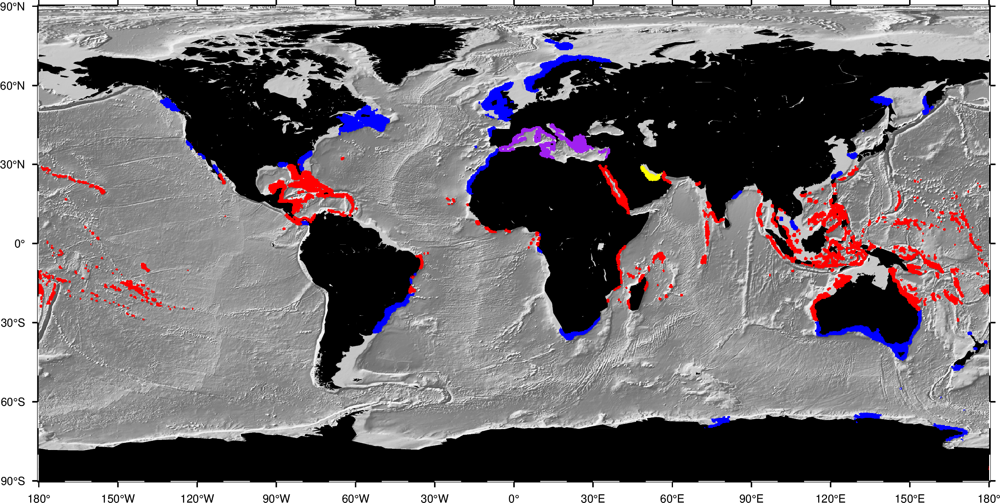

In [159]:
fig = pygmt.Figure()

pygmt.config(
    MAP_FRAME_WIDTH="0.5p",
    MAP_FRAME_TYPE="fancy",
)

# Plotting elevation
with pygmt.config(FONT='4p,Helvetica,black'):
    pygmt.makecpt(cmap="gray", series=[-15000, 4000])
    fig.basemap(region='d', projection="Q12c", frame='af') #'afg')
    
    fig.grdimage(dsCarb.elevation, shading=True, frame=False) #,transparency=50)
    
    fig.coast(land="black")
    
    pygmt.makecpt(cmap="purple", series=[1, 4])
    fig.grdimage(dsCarb.photoC, shading=False, nan_transparent=True, frame=False)
    
    pygmt.makecpt(cmap="red", series=[1, 4])
    fig.grdimage(dsCarb.photozoan, shading=False, nan_transparent=True, frame=False)
    
    pygmt.makecpt(cmap="yellow", series=[1, 4])
    fig.grdimage(dsCarb.biochemical, shading=False, nan_transparent=True, frame=False)
    
    pygmt.makecpt(cmap="blue", series=[1, 4])
    fig.grdimage(dsCarb.heterozoan, shading=False, nan_transparent=True, frame=False)
    
# with pygmt.config(FONT='6p,Helvetica,black'):
# #     fig.colorbar(position="jBC+o0c/-1.5c+w8c/0.3c+h",frame=["a5", "x+lalpha richness"])
#     fig.colorbar(position="JMR+o0.5c/0c+w4c/0.3c",frame=["a1", "x+lCarbonate Factory"])
    
fig.show(dpi=500, width=1000)
fig.savefig('carbonate_factory.pdf',dpi=300)

In [160]:
path = 'data/carbonate_factory.nc'
if os.path.exists(path):
    os.remove(path)
dsCarb.to_netcdf('data/carbonate_factory.nc')

In [161]:
dsCarb = xr.open_dataset('data/carbonate_factory.nc')
dsCarb
photozoan = dsCarb['photozoan']
photozoan = photozoan.where(photozoan != 2, 1)

photozoan.rio.to_raster('data/photozoan.tif')
photozoanDF = photozoan.to_dataframe()
photozoanDF.to_csv('data/photozoan.csv')

## Filter carbonates so they only sit on shallow marine shelves


In [162]:
ocean = f'data/rasters/0Ma_nc_outputs/gold_spn_av_0000003000_00.nc'
oceanDS = xr.open_dataset(ocean)
bathymetry = oceanDS['bathymetry']

In [163]:
reefPts = photozoanDF.dropna(axis=0).reset_index()

reefPts = reefPts[(reefPts['lat']>-50) & (reefPts['lat']<50)] # Filter out points well outside the expected range
reefPts

,lat,lon,photozoan
11,-34.666667,173.500000,1.0
12,-29.666667,167.833333,1.0
13,-29.666667,168.000000,1.0
14,-29.666667,168.166667,1.0
15,-29.666667,168.333333,1.0
...,...,...,...
44472,34.333333,-119.833333,1.0
44473,34.500000,-120.000000,1.0
44474,34.500000,-119.833333,1.0
44475,38.166667,-122.166667,1.0


In [164]:
elevationReefs = pygmt.grdtrack(bathymetry,reefPts, newcolname='bathymetry', incols=[1,0])
elevationReefs = elevationReefs.rename(columns={'lat':'lon','lon':'lat'})
elevationReefs

grdinfo [WARNING]: The step size of coordinate (latitude [degrees_north]) in grid /Users/jono/Library/CloudStorage/OneDrive-TheUniversityofSydney(Staff)/paleoReef/presentDayModelSetup/data/rasters/0Ma_nc_outputs/gold_spn_av_0000003000_00.nc is not constant.
grdinfo [WARNING]: GMT will use a constant step size of 5.58734; the original ranges from 5.53997 to 6.19537.
/Users/jono/opt/anaconda3/envs/paleoReef/lib/python3.12/site-packages/pygmt/clib/session.py:1498: RuntimeWarning: Grid may have irregular spacing in the 'latitude' dimension, but GMT only supports regular spacing. Calculated regular spacing 5.587344646453857 is assumed in the 'latitude' dimension.
  matrix, region, inc = dataarray_to_matrix(grid)


,lon,lat,photozoan
0,173.500000,-34.666667,901.056307
1,167.833333,-29.666667,642.308612
2,168.000000,-29.666667,659.061261
3,168.166667,-29.666667,676.864205
4,168.333333,-29.666667,695.716629
...,...,...,...
44461,-119.833333,34.333333,NaN
44462,-120.000000,34.500000,NaN
44463,-119.833333,34.500000,NaN
44464,-122.166667,38.166667,NaN


/Users/jono/opt/anaconda3/envs/paleoReef/lib/python3.12/site-packages/pygmt/clib/session.py:1498: RuntimeWarning: Grid may have irregular spacing in the 'latitude' dimension, but GMT only supports regular spacing. Calculated regular spacing 5.587344646453857 is assumed in the 'latitude' dimension.
  matrix, region, inc = dataarray_to_matrix(grid)


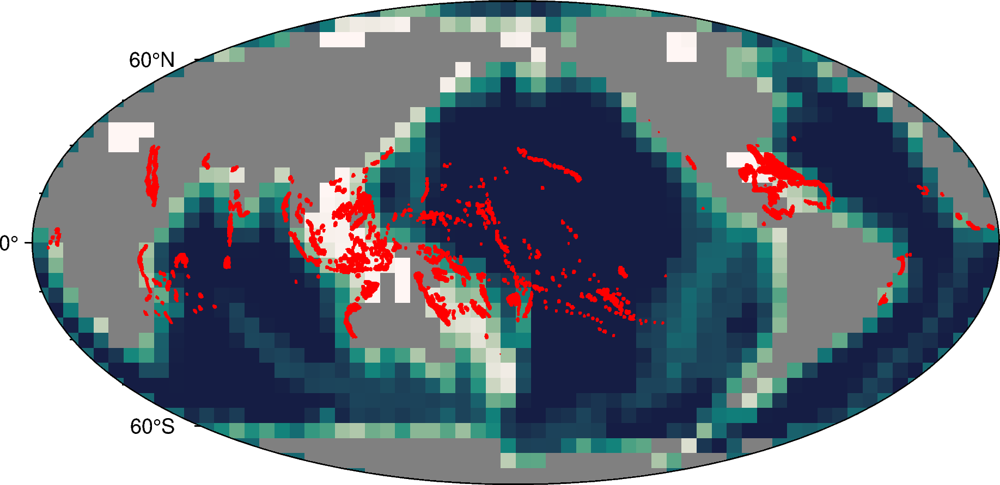

In [165]:
fig = pygmt.Figure()
fig.basemap(region="g", projection="W15c", frame=True)
fig.coast(shorelines="0.5p,black")
fig.grdimage(bathymetry,cmap='tempo')
fig.plot(elevationReefs,style="c0.01c", pen="red", fill=None)
fig.show()

/Users/jono/opt/anaconda3/envs/paleoReef/lib/python3.12/site-packages/pygmt/clib/session.py:1498: RuntimeWarning: Grid may have irregular spacing in the 'latitude' dimension, but GMT only supports regular spacing. Calculated regular spacing 5.587344646453857 is assumed in the 'latitude' dimension.
  matrix, region, inc = dataarray_to_matrix(grid)


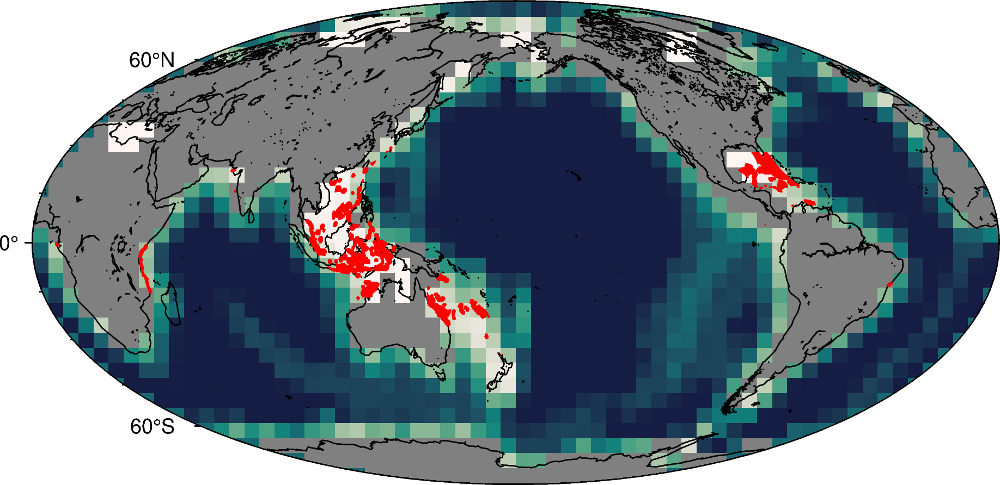

In [166]:
filteredReefs = elevationReefs.dropna(axis=0)
filteredReefs = filteredReefs[filteredReefs['photozoan']<1500]
filteredReefs['photozoan'] = 1
filteredReefs
fig = pygmt.Figure()
fig.basemap(region="g", projection="W15c", frame=True)

fig.grdimage(bathymetry,cmap='tempo')
fig.coast(shorelines="0.5p,black")
fig.plot(filteredReefs,style="c0.01c", pen="red", fill=None)
fig.show()

In [169]:
filteredReefs.to_csv('data/photozoan_filtered.csv',index=False)

## High resolution 

In [155]:
hlon = np.arange(-180,180.05,0.05)
hlat = np.arange(-90,90.05,0.05)
dsCarbh = dsCarb.reindex(lat=hlat, lon=hlon, method='nearest')

In [156]:
dsCarb['photozoan'] = dsCarb.photozoan.where((dsCarb.photozoan>0)&(dsCarb.lat<40))
dsCarb['photozoan'] = dsCarb.photozoan.where((dsCarb.photozoan>0)&(dsCarb.lat>-40))

In [157]:
dsCarbh['photozoan'] = dsCarbh.photozoan.where((dsCarbh.photozoan>0)&(dsCarbh.lat<40))
dsCarbh['photozoan'] = dsCarbh.photozoan.where((dsCarbh.photozoan>0)&(dsCarbh.lat>-40))

In [158]:
dsCarb['biochemical'] = dsCarb.biochemical.where((dsCarb.biochemical>0)&(dsCarb.lon<70))
dsCarb['biochemical'] = dsCarb.biochemical.where((dsCarb.biochemical>0)&(dsCarb.lon>30))

In [159]:
dsCarbh['biochemical'] = dsCarbh.biochemical.where((dsCarbh.biochemical>0)&(dsCarbh.lon<70))
dsCarbh['biochemical'] = dsCarbh.biochemical.where((dsCarbh.biochemical>0)&(dsCarbh.lon>30))

In [160]:
fig = pygmt.Figure()

pygmt.config(
    MAP_FRAME_WIDTH="0.5p",
    MAP_FRAME_TYPE="fancy",
)

font = "4p,Helvetica-Bold"

# Plotting elevation
with pygmt.config(FONT='4p,Helvetica,black'):
    pygmt.makecpt(cmap="gray", series=[-15000, 4000])
    fig.basemap(region='d', projection="Q12c", frame='af') #'afg')
    
    fig.grdimage(dsCarb.elevation, shading=True, frame=False) #,transparency=50)
    
    fig.coast(land="black")
    
#     pygmt.makecpt(cmap="purple", series=[1, 4])
#     fig.grdimage(dsCarb.photoC, shading=False, nan_transparent=True, frame=False)
    
    pygmt.makecpt(cmap="red", series=[1, 4])
    fig.grdimage(dsCarb.photozoan, shading=False, nan_transparent=True, frame=False)
    
#     pygmt.makecpt(cmap="yellow", series=[1, 4])
#     fig.grdimage(dsCarb.biochemical, shading=False, nan_transparent=True, frame=False)
    
#     pygmt.makecpt(cmap="blue", series=[1, 4])
#     fig.grdimage(dsCarb.heterozoan, shading=False, nan_transparent=True, frame=False)
    
#     fig.plot(x=-128, y=-68, style="r2.3/1.25", color="white", pen="0.4p,black")
    
#     fig.plot(x=-152, y=-56, style="r0.35/0.2", color="yellow", pen="0.3p,black")
#     fig.text(x=-120.5, y=-56, text="Biochemical factory", font=font)
    
#     fig.plot(x=-152, y=-64, style="r0.35/0.2", color="red", pen="0.3p,black")
#     fig.text(x=-120, y=-64, text="Photozoan T-factory", font=font)
    
#     fig.plot(x=-152, y=-72, style="r0.35/0.2", color="purple", pen="0.3p,black")
#     fig.text(x=-122.6, y=-72, text="Photo-C factory    ", font=font)
    
#     fig.plot(x=-152, y=-80, style="r0.35/0.2", color="blue", pen="0.3p,black")
#     fig.text(x=-119.5, y=-80, text="Heterozoan-C factory", font=font)
    
# fig.show(dpi=500, width=1000)
fig.savefig('carbonate_factory1.pdf',dpi=300)

grdinfo [WARNING]: Guessing of registration in conflict between x and y, using gridline
grdimage [WARNING]: Longitude range too small; geographic boundary condition changed to natural.


grdinfo [WARNING]: Guessing of registration in conflict between x and y, using gridline
grdinfo [WARNING]: Guessing of registration in conflict between x and y, using gridline
grdimage [WARNING]: Longitude range too small; geographic boundary condition changed to natural.
grdimage [WARNING]: Longitude range too small; geographic boundary condition changed to natural.
grdinfo [WARNING]: Guessing of registration in conflict between x and y, using gridline


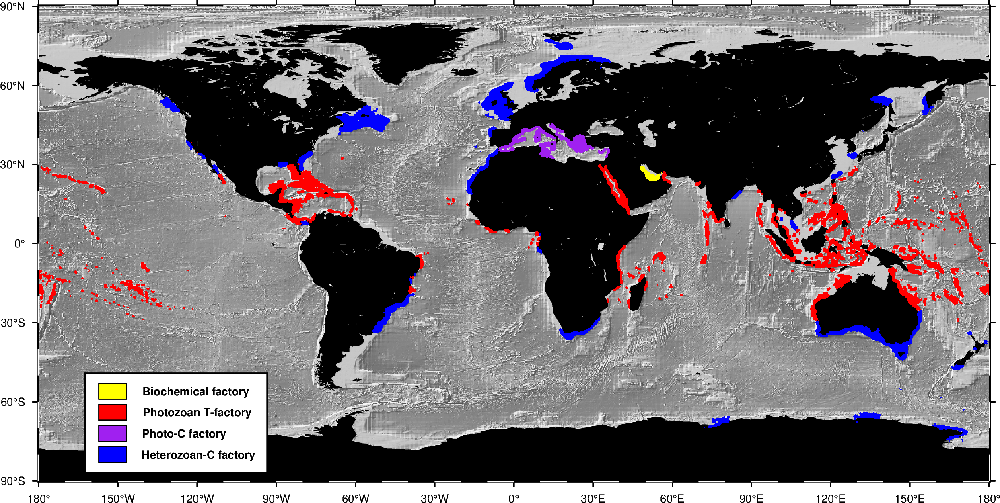

In [161]:
fig = pygmt.Figure()

pygmt.config(
    MAP_FRAME_WIDTH="0.5p",
    MAP_FRAME_TYPE="fancy",
)

font = "4p,Helvetica-Bold"

# Plotting elevation
with pygmt.config(FONT='4p,Helvetica,black'):
    pygmt.makecpt(cmap="gray", series=[-15000, 4000])
    fig.basemap(region='d', projection="Q12c", frame='af') #'afg')
    
    fig.grdimage(dsCarbh.elevation, shading=True, frame=False) #,transparency=50)
    
    fig.coast(land="black")
    
    pygmt.makecpt(cmap="purple", series=[1, 4])
    fig.grdimage(dsCarbh.photoC, shading=False, nan_transparent=True, frame=False)
    
    pygmt.makecpt(cmap="red", series=[1, 4])
    fig.grdimage(dsCarbh.photozoan, shading=False, nan_transparent=True, frame=False)
    
    pygmt.makecpt(cmap="yellow", series=[1, 4])
    fig.grdimage(dsCarbh.biochemical, shading=False, nan_transparent=True, frame=False)
    
    pygmt.makecpt(cmap="blue", series=[1, 4])
    fig.grdimage(dsCarbh.heterozoan, shading=False, nan_transparent=True, frame=False)
    
    fig.plot(x=-128, y=-68, style="r2.3/1.25", fill="white", pen="0.4p,black")
    
    fig.plot(x=-152, y=-56, style="r0.35/0.2", fill="yellow", pen="0.3p,black")
    fig.text(x=-120.5, y=-56, text="Biochemical factory", font=font)
    
    fig.plot(x=-152, y=-64, style="r0.35/0.2", fill="red", pen="0.3p,black")
    fig.text(x=-120, y=-64, text="Photozoan T-factory", font=font)
    
    fig.plot(x=-152, y=-72, style="r0.35/0.2", fill="purple", pen="0.3p,black")
    fig.text(x=-122.6, y=-72, text="Photo-C factory    ", font=font)
    
    fig.plot(x=-152, y=-80, style="r0.35/0.2", fill="blue", pen="0.3p,black")
    fig.text(x=-119.5, y=-80, text="Heterozoan-C factory", font=font)
    
fig.show(dpi=500, width=1000)
fig.savefig('data/carbonate_factory_hr.pdf',dpi=300)

In [162]:
# dsCarbh.to_netcdf('data/carbonate_factory_hr.nc')